In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

In [2]:
traindata = pd.read_csv('train_FD001.txt',sep=' ',header = None)
testdata = pd.read_csv('test_FD001.txt',sep=' ',header = None)
RULdata = pd.read_csv('RUL_FD001.txt',sep=' ',header = None)

In [3]:
columns = {0:'engineNumber',1:'cycleNumber',2:'opSetting1',3:'opSetting2',4:'opSetting3',5:'sensor1',6:'sensor2',
           7:'sensor3',8:'sensor4',9:'sensor5',10:'sensor6',11:'sensor7',12:'sensor8',13:'sensor9',14:'sensor10',
           15:'sensor11',16:'sensor12',17:'sensor13',18:'sensor14',19:'sensor15',20:'sensor16',
           21:'sensor17',22:'sensor18',23:'sensor19',24:'sensor20',25:'sensor21'}

In [4]:
train_data = traindata.rename(columns=columns)
test_data = testdata.rename(columns=columns)
true_rul = RULdata.rename(columns={0: 'RUL'})

In [5]:
train_data = traindata.rename(columns=columns)
test_data = testdata.rename(columns=columns)
true_rul = RULdata.rename(columns={0: 'RUL'})

In [6]:
num_cycles_to_failure = train_data.groupby('engineNumber')['cycleNumber'].count()
num_cycles_to_failure


engineNumber
1      192
2      287
3      179
4      189
5      269
      ... 
96     336
97     202
98     156
99     185
100    200
Name: cycleNumber, Length: 100, dtype: int64

In [7]:
EOL = []
for sl_no in train_data['engineNumber']:
    EOL.append( ( (train_data[train_data['engineNumber'] == sl_no]['cycleNumber']).values)[-1])

In [8]:
# X = train_data['sensor2'] 
train_data['RUL'] = EOL-train_data['cycleNumber']

In [9]:
train_data['sensor9']

0        9046.19
1        9044.07
2        9052.94
3        9049.48
4        9055.15
          ...   
20626    9065.52
20627    9065.11
20628    9065.90
20629    9073.72
20630    9061.48
Name: sensor9, Length: 20631, dtype: float64

In [10]:
def plot_sensor(sensor_name):
    plt.figure(figsize=(24,8),dpi=200)
    
    for i in train_data['engineNumber'].unique():
        
        if (i%10 == 0): #Only plot every 10th unit
#             rgb = np.random.rand(3,)
            plt.plot('RUL',sensor_name,data = train_data[train_data['engineNumber']==i])
            
        plt.xlim(250,0)
        plt.xticks(np.arange(0,275,25))
        plt.ylabel(sensor_name)
        plt.xlabel('Remaining useful Life')

In [11]:
sensor_names = ['sensor{}'.format(i) for i in range(1,22)]

In [12]:
sensor_names

['sensor1',
 'sensor2',
 'sensor3',
 'sensor4',
 'sensor5',
 'sensor6',
 'sensor7',
 'sensor8',
 'sensor9',
 'sensor10',
 'sensor11',
 'sensor12',
 'sensor13',
 'sensor14',
 'sensor15',
 'sensor16',
 'sensor17',
 'sensor18',
 'sensor19',
 'sensor20',
 'sensor21']

C:\Users\Rukku\AppData\Local\Temp/ipykernel_8316/3595494330.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(24,8),dpi=200)


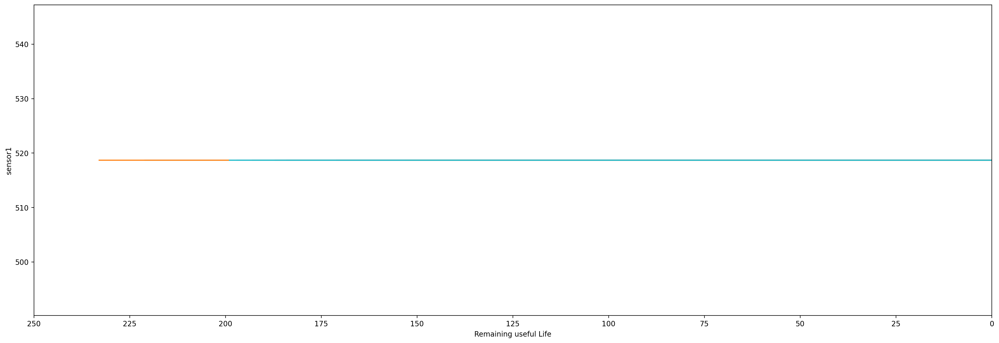

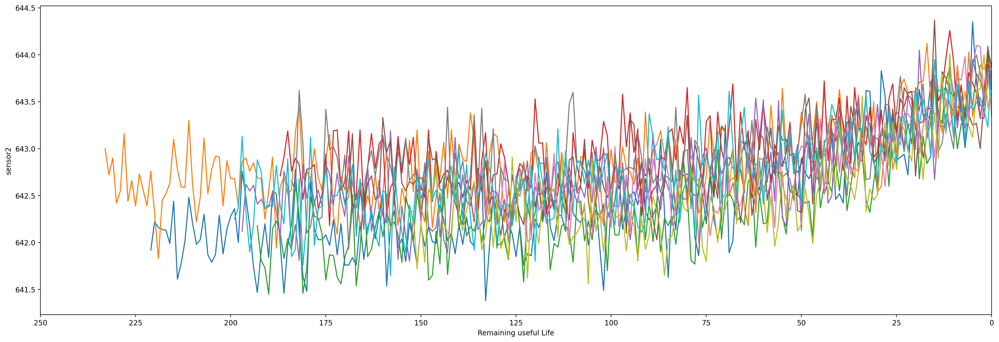

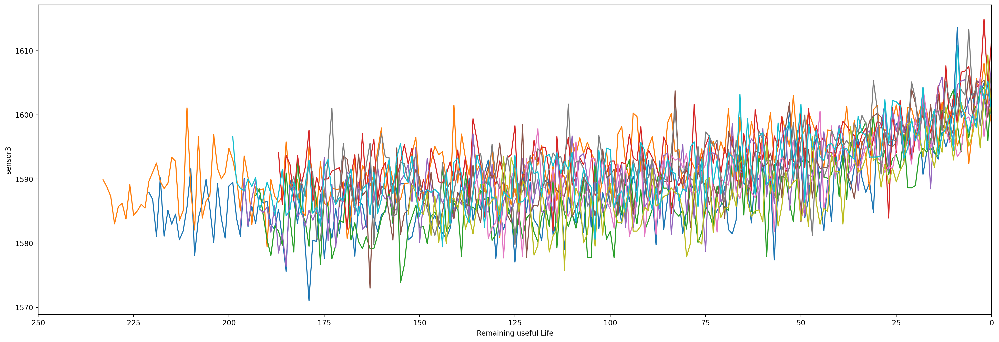

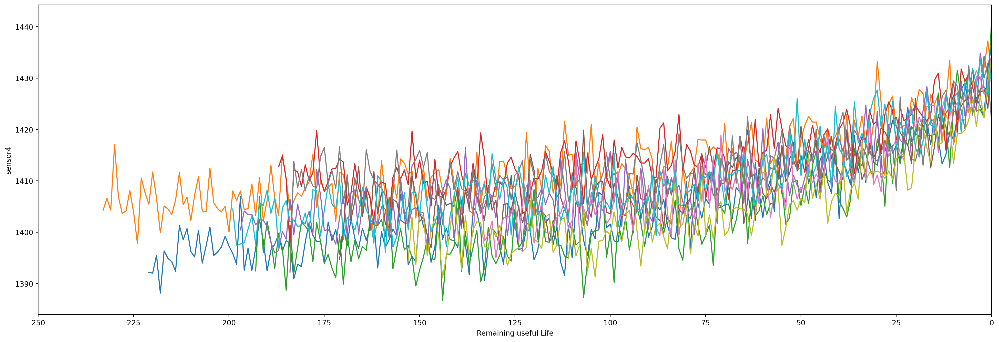

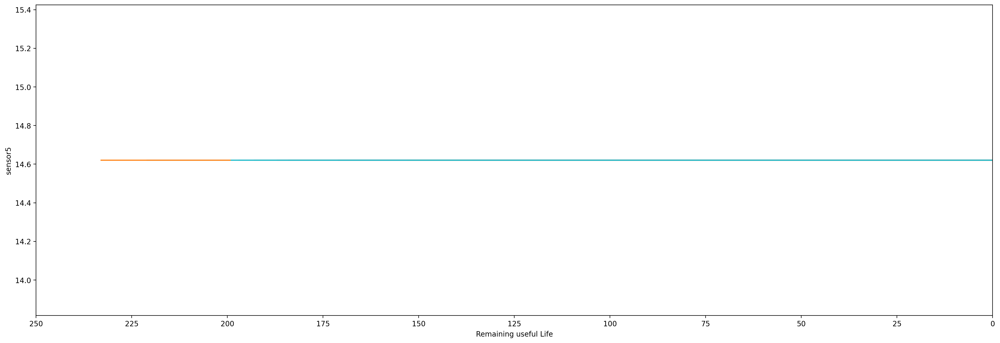

...

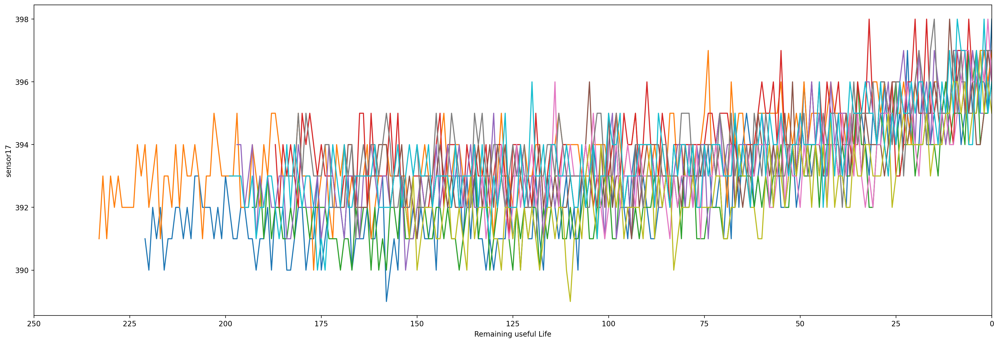

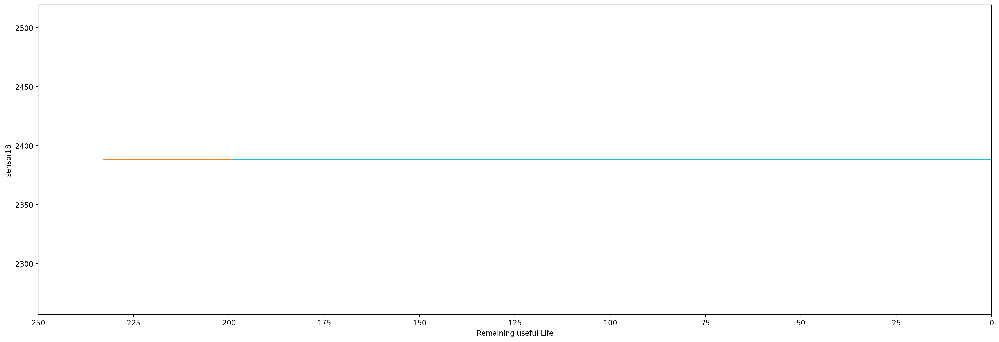

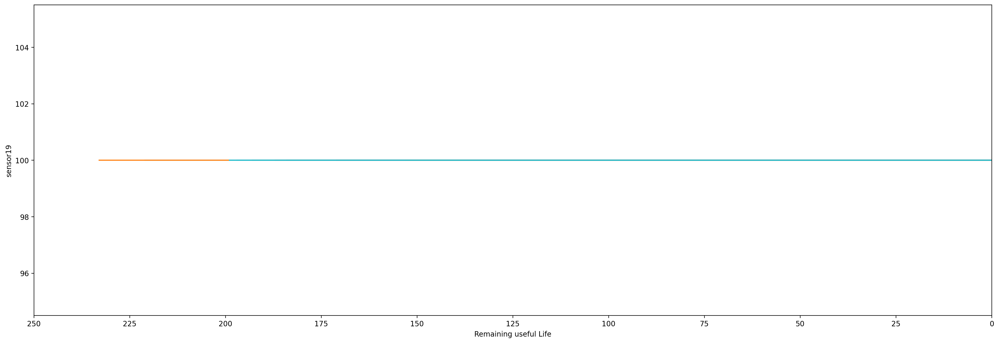

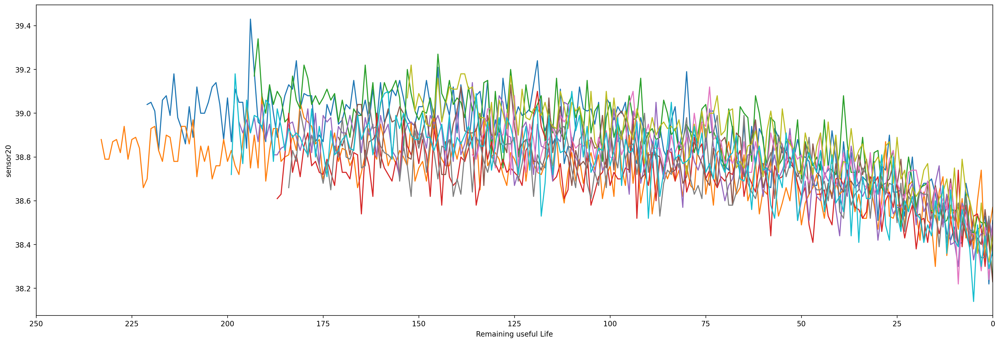

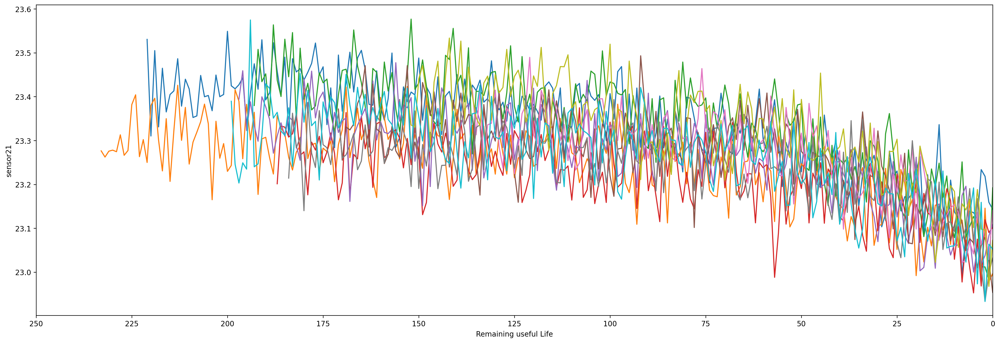

In [13]:
for sensor in sensor_names:
    plot_sensor(sensor)